In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly as py
import plotly.figure_factory as ff



In [10]:
PATH = "./"
train = pd.read_csv(f"{PATH}/train.csv", low_memory=False, 
                    parse_dates=['date'], index_col=['date'])
test = pd.read_csv(f"{PATH}/test.csv", low_memory=False, 
                   parse_dates=['date'], index_col=['date'])
sample_sub = pd.read_csv(f"{PATH}/sample_submission.csv")

In [11]:
train

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,10,50,63
2017-12-28,10,50,59
2017-12-29,10,50,74


In [12]:
subTrain = train[train.store==1]

# Visualize all products of a store

Note the periodicity. Every year there is a ''sin curve'' but sales increase every year. 

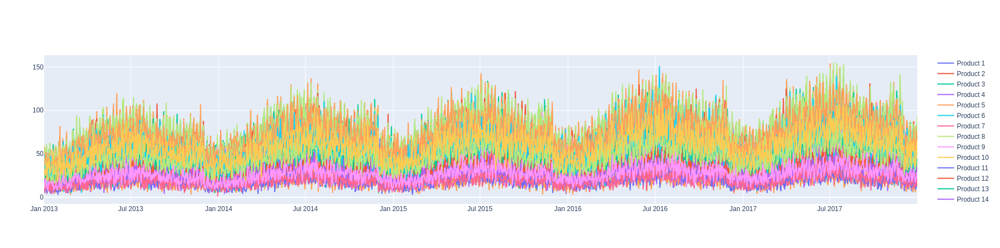

In [14]:

data=[]
for i in range(50):
    data.append(go.Scatter(x=subTrain[subTrain.item==i+1].index, y=subTrain[subTrain.item==i+1].sales,
                    mode='lines',
                    name='Product {}'.format(i+1)))
py.offline.iplot(data)


## Lets see one product of the store 


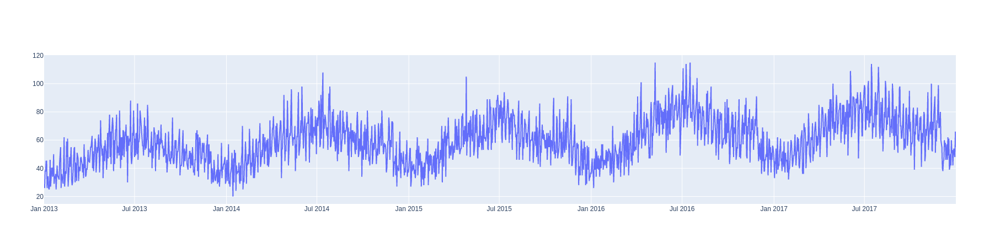

In [15]:

data=[]
data.append(go.Scatter(x=subTrain[subTrain.item==35].index, y=subTrain[subTrain.item==35].sales,
                    mode='lines',
                    name='Product {}'.format(35)))
py.offline.iplot(data)

In [16]:
## Lets try to predict its demand through time. 

In [18]:
# Expand dataframe with more useful columns
def expand_df(df):
    data = df.copy()
    data['day'] = data.index.day
    data['month'] = data.index.month
    data['year'] = data.index.year
    data['dayofweek'] = data.index.dayofweek
    return data

data = expand_df(train)

In [29]:
grand_avg = data.sales.mean()


In [30]:
# Item-Store Look Up Table
store_item_table = pd.pivot_table(data, index='store', columns='item',
                                  values='sales', aggfunc=np.mean)
display(store_item_table)

# Monthly pattern
month_table = pd.pivot_table(data, index='month', values='sales', aggfunc=np.mean)
month_table.sales /= grand_avg

# Day of week pattern
dow_table = pd.pivot_table(data, index='dayofweek', values='sales', aggfunc=np.mean)
dow_table.sales /= grand_avg

# Yearly growth pattern
year_table = pd.pivot_table(data, index='year', values='sales', aggfunc=np.mean)
year_table /= grand_avg

item,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
store,,,,,,,,,,,,,,,,,,,,,
1,19.971522,53.148959,33.208105,19.956188,16.612815,53.060789,52.783680,69.472070,46.504929,66.354326,...,20.002738,33.105696,46.242607,26.594195,72.720701,52.845016,19.814348,46.546002,26.461665,59.342826
2,28.173604,75.316539,46.992333,28.234940,23.540526,74.945235,75.058598,99.090361,65.478094,94.097481,...,28.069551,47.368018,65.785323,37.785871,103.381161,75.219606,28.187842,66.028478,37.711939,84.622125
3,25.070099,66.804491,41.771084,25.116101,20.857612,67.007119,66.647864,87.517525,58.486857,83.387733,...,24.989047,41.797371,58.197700,33.386090,91.851041,66.748083,25.120482,58.700986,33.259584,74.958379
4,22.938664,61.715225,38.548193,23.086528,19.525192,61.270537,61.625411,80.819825,54.043812,77.047645,...,23.168127,38.539978,54.018620,30.952355,84.687295,61.420044,23.114458,53.765608,30.840635,68.921687
5,16.739321,44.488499,27.835706,16.776561,14.086528,44.564622,44.535597,58.565717,38.837349,55.509858,...,16.830778,27.730559,39.163198,22.415115,61.427163,44.734940,16.699343,39.281490,22.371851,50.319277
6,16.717963,44.533954,27.811062,16.754107,13.893209,44.503834,44.599124,58.385542,39.460022,55.565170,...,16.607338,27.893209,39.034502,22.322563,61.142935,44.539978,16.708653,39.052574,22.181271,50.516429
7,15.159365,40.717963,25.531216,15.358160,12.733844,40.703724,40.709748,53.723987,35.901972,51.156627,...,15.471522,25.435926,35.426068,20.446331,55.905805,40.828587,15.479189,35.624315,20.406353,45.823658
8,26.983571,71.656627,45.076123,26.948521,22.427711,71.958379,71.730559,94.461117,63.193319,89.818182,...,27.036145,45.144031,62.980285,36.194414,98.941402,72.004929,27.150055,62.737130,36.035049,80.972070
9,23.325849,61.792442,38.535049,23.150055,19.272180,61.412377,61.812158,81.287514,54.105696,77.105148,...,23.191128,38.643483,54.152793,30.968237,85.093647,62.010953,23.003286,53.976999,31.052574,69.308324


In [32]:
years = np.arange(2013, 2019)

annual_sales_avg = year_table.values.squeeze()

p2 = np.poly1d(np.polyfit(years[:-1], annual_sales_avg, 2))

annual_growth = p2

In [33]:
def slightly_better(test, submission):
    submission[['sales']] = submission[['sales']].astype(np.float64)
    for _, row in test.iterrows():
        dow, month, year = row.name.dayofweek, row.name.month, row.name.year
        item, store = row['item'], row['store']
        base_sales = store_item_table.at[store, item]
        mul = month_table.at[month, 'sales'] * dow_table.at[dow, 'sales']
        pred_sales = base_sales * mul * annual_growth(year)
        submission.at[row['id'], 'sales'] = pred_sales
    return submission

# slightly_better_pred = slightly_better(test, sample_sub.copy())
# slightly_better_pred.to_csv("sbp_float.csv", index=False)

# # Round to nearest integer (if you want an integer submission)
# sbp_round = slightly_better_pred.copy()
# sbp_round['sales'] = np.round(sbp_round['sales']).astype(int)
# sbp_round.to_csv("sbp_round.csv", index=False)

In [39]:
test

,id,store,item
date,,,
2018-01-01,0,1,1
2018-01-02,1,1,1
2018-01-03,2,1,1
2018-01-04,3,1,1
2018-01-05,4,1,1
...,...,...,...
2018-03-27,44995,10,50
2018-03-28,44996,10,50
2018-03-29,44997,10,50


In [40]:
test

,id,store,item
date,,,
2018-01-01,0,1,1
2018-01-02,1,1,1
2018-01-03,2,1,1
2018-01-04,3,1,1
2018-01-05,4,1,1
...,...,...,...
2018-03-27,44995,10,50
2018-03-28,44996,10,50
2018-03-29,44997,10,50


In [42]:
predDates = []
predSales = []
for _, row in test.iterrows():

    dow, month, year = row.name.dayofweek, row.name.month, row.name.year
    # 35, store = row['item'], row['store']
    item = 35
    store = 1 
    base_sales = store_item_table.at[store, item]
    mul = month_table.at[month, 'sales'] * dow_table.at[dow, 'sales']
    pred_sales = base_sales * mul * annual_growth(year)
    predDates.append(row.name)
    predSales.append(pred_sales)

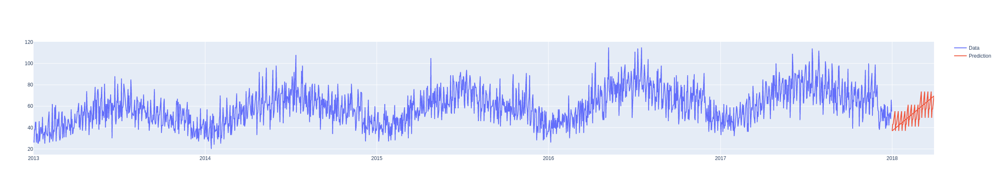

In [46]:
dates.sort
data=[]
data.append(go.Scatter(x=subTrain[subTrain.item==35].index, y=subTrain[subTrain.item==35].sales,
#                     mode='lines',
                    name='Data'))

data.append(go.Scatter(x=predDates, y=predSales,
#                     mode='lines',
                    name='Prediction'))
py.offline.iplot(data)